In [192]:
import numpy as np
from matplotlib import pyplot as plt
import scipy.stats as sc
from IPython import display
from scipy.interpolate import interp1d
import time
import copy

from matplotlib import animation, rc
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML
from cycler import cycler
import os
from matplotlib.patches import Rectangle,Circle

GRID_SHAPE = (100,100)   #the dimensions of the world

In [269]:
class Ant(object):
    """Represents an ant in a world with food, obstacles, and pheromones"""
    
    def __init__(self, initial_loc,world_shape,block):
        self.loc = np.array(initial_loc) #location of the ant        
        self.block = block                #where you can't go
        self.change_dir_prob = .5
        self.hive = np.array(initial_loc) #position of home nest
        self.hasFood = False            # whether the ant is carrying food
        self.p_hive = 0   #probability of moving toward hive
        self.follow_pheromones_prob = 1    # probability of following pheromones instead of taking random step
        self.world_shape = world_shape   #dimensions of the world
        self.direction = np.array([0,0])
        self.update_dir(random=True)
    
    # method to change the location of the ant
    def step(self,food,pheromones,all_pheromones):                        
        if tuple(self.loc) == (9,50) and np.random.rand() < .97: #stuck!
            return
        
        self.leave_pheromone(all_pheromones,1)
        #check state of location
        if food[self.loc[0],self.loc[1]] > 0:
            self.hasFood = True
            self.p_hive = 1
        if self.hasFood and all(self.loc == self.hive):
            self.hasFood = False
            self.p_hive = 0
            self.update_dir(random=True)
            return
        
        #return to hive
        if self.hasFood: 
            self.leave_pheromone(pheromones,1)
            if np.random.rand() < self.p_hive:
                self.move_to_hive(pheromones)
        
        #looking for food
        elif self.near_pheromones(pheromones) and np.random.rand() < self.follow_pheromones_prob:
            self.follow_pheromones(pheromones)
        
        else:            
            if np.random.rand() < self.change_dir_prob:
                self.update_dir()
        
        self.move_forward()

        
    def near_pheromones(self,pheromones,dirs = None):
        if type(dirs) == type(None):
            dirs = self.possible_directions(ahead = True)
        locs = dirs + self.loc
        return np.sum([pheromones[r,c] for [r,c] in locs])
        
        """return np.sum(pheromones[self.loc[0]-1:self.loc[0]+2,self.loc[1]-1:self.loc[1]+2]) > 0  #POSSIBLE BUG
        loc1 = self.loc
        loc2 = self.loc + self.direction
        sum_ph = np.sum(pheromones[min(loc1[0],loc2[0]):max(loc1[0],loc2[0])+1,min(loc1[1],loc2[1]):max(loc1[1],loc2[1])+1])
        #if (sum_ph > 0):
        #    print(sum_ph, loc1,loc2)
        return sum_ph > 0"""
    
    def follow_pheromones(self,pheromones,return_prob = False):
        at_hive = all(self.loc == self.hive)        
        newDirs = self.possible_directions(ahead = not at_hive) #self.possible_newlocs() #behind_dir = behind_okay,
        #if len(newDirs) == 0:
        #    newDirs = self.possible_directions()
        vals = [pheromones[r,c] for r,c in newDirs + self.loc]        
        """if at_hive: #choose randomly from hive
            vals = np.array(vals) != 0
            prob = vals / np.sum(vals)
            self.direction = self.random_choice(newDirs,prob)
            return"""
        
        ph_prob = np.array(vals)/np.sum(vals)
        if return_prob: return ph_prob
        dist_prob = self.getProb(newDirs)
        alpha = 0  #how much to weight in direction
        prob = ph_prob + alpha*dist_prob
        prob /= np.sum(prob)         
                               
        # chose move closest to direction we were going
        #print("NEW DIRECTION")
        #print("Me",self.loc,self.direction)
        #print(bestMoves)

        #bestMoves = self.argmin_max(vals,max,newDirs)
        #chosen = self.closest_to(self.direction,bestMoves,random_choice=True)
        chosen = self.random_choice(newDirs,prob)
        self.direction = chosen

    def move_to_hive(self,pheromones):
        # choose closest direction to hive       
        hive_dir = np.sign(self.hive - self.loc)
        if self.allowed_loc(hive_dir + self.loc):
            self.direction = hive_dir
            return
        
        newDirs = self.possible_directions()
                
        closest = self.closest_to(hive_dir,newDirs,random_choice=False)                
        if self.near_pheromones(pheromones) and np.random.rand() < 1:
            self.follow_pheromones(pheromones)#,return_prob = True)
            return
                
        #dist_prob = self.getProb(closest)        
        #prob = dist_prob + ph_prob
        #prob /= np.sum(prob)
        
        #chosen = self.random_choice(closest,prob)
        chosen = self.closest_to(self.direction,closest,random_choice=True)        
        
        
        
        
        """if all(chosen == hive_dir):
            self.p_hive = 1
        else:
            self.p_hive /= 2"""
        if any(chosen != hive_dir) and all(chosen == self.direction*-1):
            return
        self.direction = chosen
    
    def closest_to(self,loc,arr,random_choice=False):
        distances = self.getAngles(loc,arr)
        #print ("Distances", distances)
        best = self.argmin_max(distances,min,arr) #np.argmin(distances)
        #print ("best", best)
        #best = [arr[i] for i in mins]
        if random_choice:
            return self.random_choice(best)
        return best    
    
    def argmin_max(self,arr,arg,elems = None):
        max_val = arg(arr)
        #print(arg,max_val)
        indices = [i for i in range(len(arr)) if arr[i] == max_val]
        if type(elems) == np.ndarray or type(elems) == list:
            return np.array([elems[j] for j in indices]) 
        return np.array(indices)
        
    
    def getAngles(self,loc,arr):        
        loc_u = loc / np.linalg.norm(loc)
        arr_u = arr / np.linalg.norm(arr,axis=1,keepdims=True)
        return np.arccos(np.clip(np.dot(arr_u, loc_u), -1.0, 1.0))       
    
    def getProb(self,dirs,d):
        angle = self.getAngles(self.direction,dirs)
        std = np.pi/4        
        prob = sc.norm(0,std).pdf(angle)
        prob /= np.sum(prob)
        return prob
    
    def update_dir(self,random=False):
        #print("Me",self.loc,self.direction)
        dirs = self.possible_directions(original_dir = True)
        if random:
            self.direction = self.random_choice(dirs)
            return               
        
        #compute prob
        prob = self.getProb(dirs)
        #print(prob)
        self.direction = self.random_choice(dirs,prob)
        #print(self.direction)
        
        
    def random_choice(self,arr, p = None):
        i = np.random.choice(range(len(arr)),p = p)
        return arr[i]
    
    def allowed_loc(self,loc):
        r,c = loc
        if 0 <= r < self.world_shape[0] and 0 <= c < self.world_shape[1] and self.block[r,c] == 0:
            return True
        return False        
    
    def move_forward(self):
        newLoc = self.loc + self.direction
        if not self.allowed_loc(newLoc):
            self.update_dir()
            self.move_forward()
        else:
            self.loc = newLoc
    
    # move in random legal direction
    def move_randomly(self):
        locs = self.possible_newlocs()
        index = np.random.choice(range(len(locs)))
        self.loc = locs[index]
            
    
    # returns a list of possible directions represented as [0,1] or [-1,1]. i.e. some displacement
    def possible_directions(self,original_dir = True,behind_dir = True,ahead = False):
        dirs = []
        for x in [-1,0,1]:
            for y in [-1,0,1]:
                if (x,y) == (0,0):
                    continue
                if ahead and np.dot(self.direction,[x,y]) < 0:
                    continue                
                if not original_dir and (x,y) == tuple(self.direction):
                    continue
                if not behind_dir and (x,y) == tuple(-self.direction):
                    continue
                
                newLoc = (x + self.loc[0],y + self.loc[1])
                if self.allowed_loc(newLoc):
                    dirs.append([x,y])                            
        return np.array(dirs)
    
    def possible_newlocs(self,original_dir = True):                 
        return self.possible_directions(original_dir) + self.loc
    
    def leave_pheromone(self,pheromones,val):
        pheromones[self.loc[0],self.loc[1]] += val
        
        

In [243]:
def rc_to_xy(loc):
    r,c = loc
    return c,r 

def xy_to_rc(loc):
    x,y = loc
    return y,x

# blocks = (x,y,w,h,val)
def init_grid(blocks,grid_shape):
    grid = np.zeros(grid_shape)
    for x,y,w,h,val in blocks:
        #rf,cf = xy_to_rc((x,y))
        for r,c in [(i,j) for i in range(y,y+h+1) for j in range(x,x+w+1)]:
            if 0 <= r < grid.shape[0] and 0 <= c < grid.shape[1]:            
                grid[r,c] += val
    return grid

def init_colony(num_ants,hive_loc,grid_dims,block):
    colony = []
    for i in range(num_ants):
        ant = Ant(hive_loc,grid_dims,block)
        colony.append(ant)
    return colony

def ant_locations(colony,grid_dims):
    locs = np.zeros(grid_dims)
    for a in colony:
        locs[a.loc[0],a.loc[1]] += 1
    return locs
    
def get_colony_locs(colony):
    x,y = [],[]
    for ant in colony:
        r,c = ant.loc        
        x.append(c)
        y.append(r)
    return [x,y]

def evaporation(pheromone,val=0.1):
    return np.clip(pheromone - val,0,None)

#takes in array of [x_locs,y_locs] and converts
def plot_colony(locs):
    plt.scatter(locs[0],locs[1],marker='.',color='r')

def plot_blocks(foods,color='orange'):
    for (x,y,w,h,v) in foods:
        plt.gca().add_patch(Rectangle((x,y),w,h,linewidth=1,edgecolor=color,facecolor=color))

    

<IPython.core.display.Javascript object>


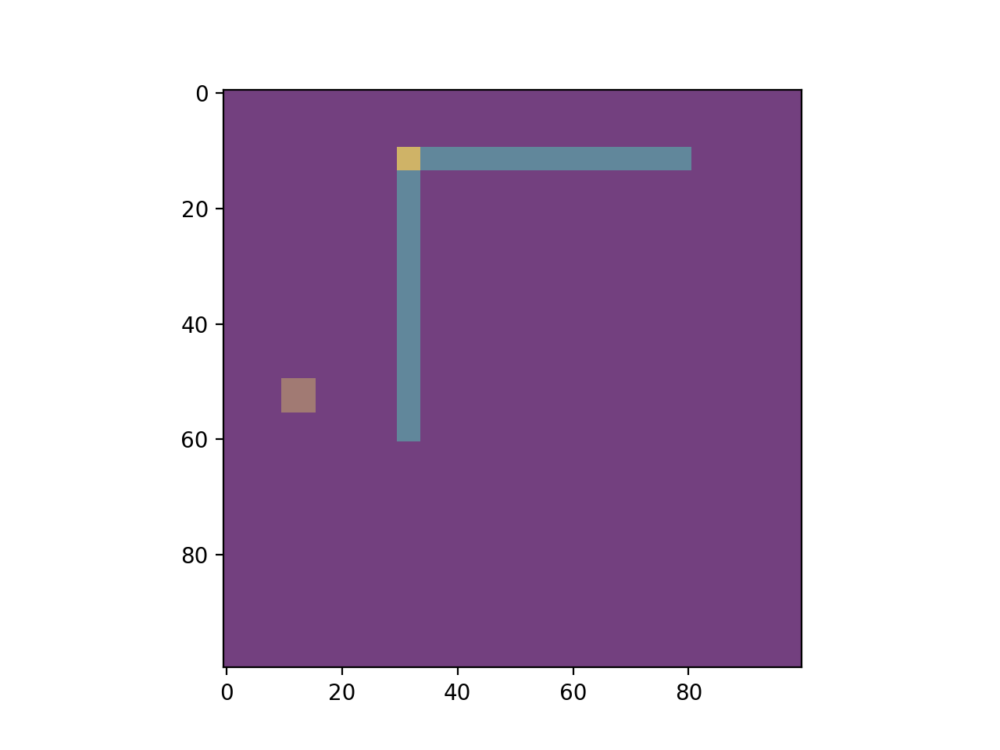

In [186]:
#init food and blocks
foods = [(10,50,5,5,2)]  #left middle
#foods = [(85,10,5,5,2)] #top right
#foods = [(20,30,5,5,2),(20,80,5,5,2)]
#foods = [(20,20,5,5,2),(20,80,5,5,2),(80,20,5,5,2),(80,80,5,5,2)] 
#foods = [(10,10,5,5,2),(10,90,5,5,2),(90,10,5,5,2),(90,90,5,5,2)] 
blocks = [] #[(30,40,3,15,2)]
blocks = [(30,10,3,50,2),(30,10,50,3,2)]

block = init_grid(blocks,GRID_SHAPE)
food = init_grid(foods,GRID_SHAPE)
%matplotlib notebook
plt.imshow(food, interpolation='nearest',alpha=.5)
plt.imshow(block, interpolation='nearest',alpha=.5) #cmap='hot'
plt.show()

<IPython.core.display.Javascript object>


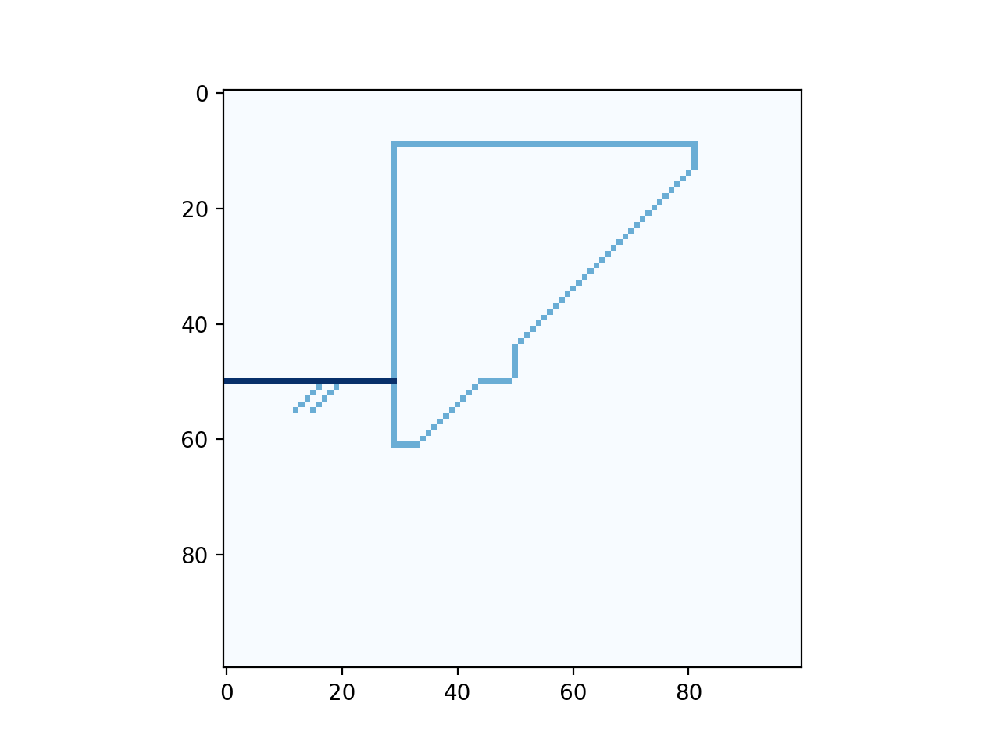

2 1


In [285]:
#pheromones_unit = np.clip(pheromones,0,1)
pheromones_unit[50,:30] = 2
plt.imshow(pheromones_unit, interpolation='nearest',cmap='Blues')
print(pheromones_unit[50,9],pheromones_unit[9,50])

In [286]:
#total_use_shorter = []
#total_use_longer = []
#total_food_shorter = []
#total_food_longer = []
#for i in range(20):
longer = []
shorter = []
longer_all = []
shorter_all = []
pheromones = pheromones_unit
#pheromones = np.zeros(GRID_SHAPE)
all_pheromones = np.zeros(GRID_SHAPE)
nest =  (50,50) #(10,90)
num_ants = 20
colony = init_colony(num_ants,nest,GRID_SHAPE,block)

NumFrames = 1000
frames = []
ph_frames = []
colony_frames = []
for t in range(NumFrames):
    evaporation(pheromones,val=0.01)
    for a in colony:
        a.step(food,pheromones,all_pheromones)
    p_frame = copy.copy(pheromones)
    longer.append(pheromones[9,31])
    shorter.append(pheromones[61,31])
    longer_all.append(all_pheromones[9,31])
    shorter_all.append(all_pheromones[61,31])
    ph_frames.append(p_frame)    
    colony_frames.append(get_colony_locs(colony))
ph_frames[0][0,0] += .001  
"""plt.plot(range(len(shorter_all)),shorter_all,'g',label='shorter path - Total use')
plt.plot(range(len(shorter_all)),longer_all,'g--',label='longer path - Total use')
plt.plot(range(len(shorter)),shorter,'b',label='shorter path - Food pheromones')
plt.plot(range(len(shorter)),longer,'b--',label='longer path - Food pheromones')
plt.xlabel("Time step")
plt.ylabel("Pheromone Strength (# Ants)")
plt.legend()
plt.savefig("random_shorter_better_loop%d"%i)
plt.close()

total_use_shorter.append(shorter_all[-1])
total_use_longer.append(longer_all[-1])
total_food_shorter.append(shorter[-1])
total_food_longer.append(longer[-1])"""

'plt.plot(range(len(shorter_all)),shorter_all,\'g\',label=\'shorter path - Total use\')\nplt.plot(range(len(shorter_all)),longer_all,\'g--\',label=\'longer path - Total use\')\nplt.plot(range(len(shorter)),shorter,\'b\',label=\'shorter path - Food pheromones\')\nplt.plot(range(len(shorter)),longer,\'b--\',label=\'longer path - Food pheromones\')\nplt.xlabel("Time step")\nplt.ylabel("Pheromone Strength (# Ants)")\nplt.legend()\nplt.savefig("random_shorter_better_loop%d"%i)\nplt.close()\n\ntotal_use_shorter.append(shorter_all[-1])\ntotal_use_longer.append(longer_all[-1])\ntotal_food_shorter.append(shorter[-1])\ntotal_food_longer.append(longer[-1])'

In [151]:
print(np.mean(total_use_shorter),total_use_shorter)
print(np.mean(total_use_longer),total_use_longer)
print(np.mean(total_food_shorter),total_food_shorter)
print(np.mean(total_food_longer),total_food_longer)

1045.4 [1737.0, 1117.0, 1563.0, 464.0, 484.0, 815.0, 1375.0, 567.0, 521.0, 1824.0, 1132.0, 518.0, 1773.0, 702.0, 1170.0, 947.0, 1413.0, 538.0, 1261.0, 987.0]
973.55 [645.0, 952.0, 777.0, 1192.0, 1255.0, 1070.0, 868.0, 1171.0, 1237.0, 573.0, 999.0, 1245.0, 585.0, 1072.0, 938.0, 1060.0, 766.0, 1242.0, 868.0, 956.0]
497.8 [603.0, 506.0, 595.0, 411.0, 418.0, 473.0, 544.0, 433.0, 417.0, 630.0, 537.0, 431.0, 594.0, 417.0, 506.0, 483.0, 543.0, 437.0, 521.0, 457.0]
505.0 [582.0, 523.0, 572.0, 409.0, 447.0, 467.0, 573.0, 430.0, 457.0, 565.0, 522.0, 447.0, 579.0, 456.0, 540.0, 515.0, 536.0, 444.0, 533.0, 503.0]


<IPython.core.display.Javascript object>


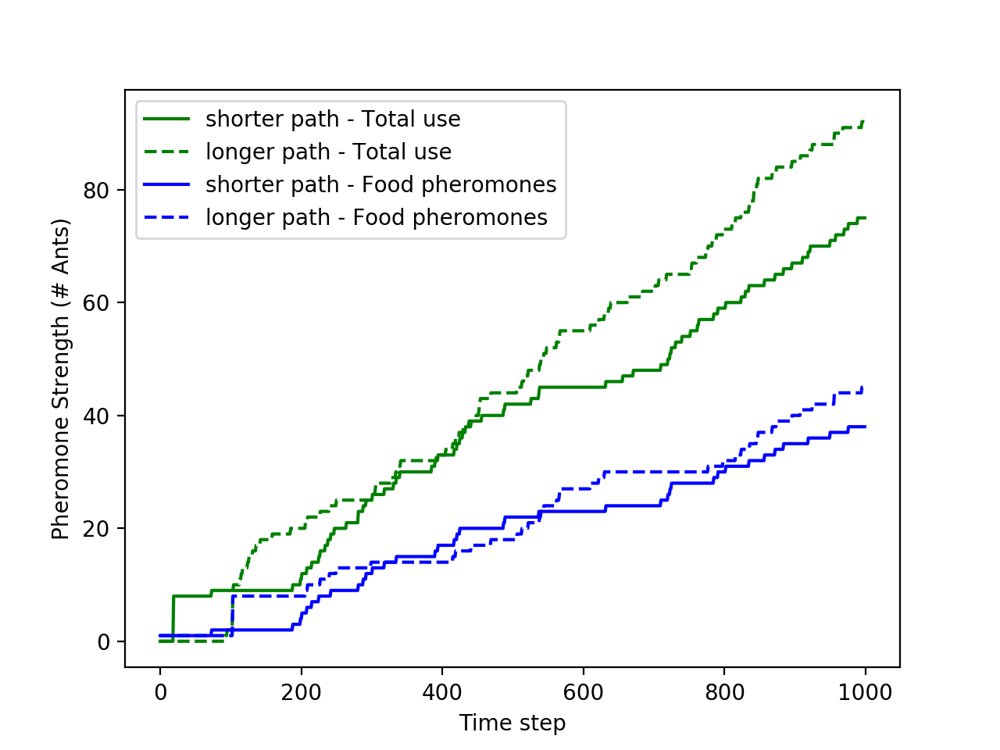

In [287]:
plt.plot(range(len(shorter_all)),shorter_all,'g',label='shorter path - Total use')
plt.plot(range(len(shorter_all)),longer_all,'g--',label='longer path - Total use')
plt.plot(range(len(shorter)),shorter,'b',label='shorter path - Food pheromones')
plt.plot(range(len(shorter)),longer,'b--',label='longer path - Food pheromones')
plt.xlabel("Time step")
plt.ylabel("Pheromone Strength (# Ants)")
plt.legend()
#plt.savefig("null_50_precent_prob")
plt.show()

In [89]:
#ph = ph_frames[-1]
#TWO_TRAIL_PH = np.clip(ph,0,1) 
print(ph[9,31],ph[61,31])
#print(TWO_TRAIL_PH[50,23],TWO_TRAIL_PH[20,29],TWO_TRAIL_PH[60,29])

4000.0 4070.0


In [77]:
import pickle
pickle.dump(TWO_TRAIL_PH,open( "two_trail_path.p", "wb" ))

<IPython.core.display.Javascript object>


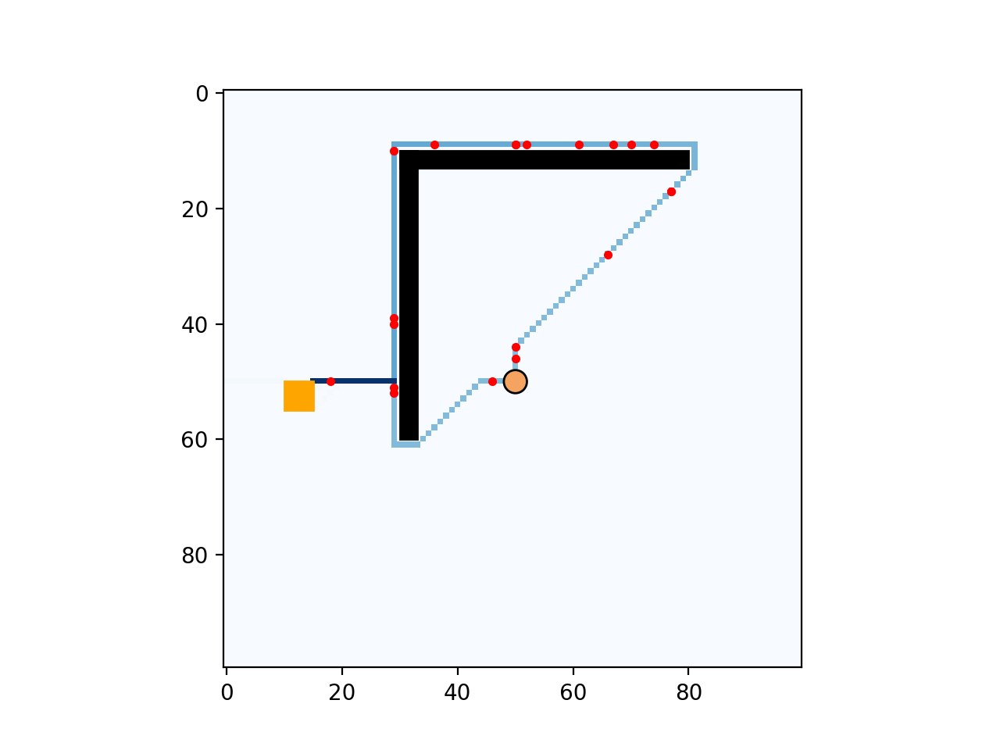

In [288]:
# display some of the pheromones
%matplotlib notebook
index = -1
plot_blocks(foods,'orange')
plot_blocks(blocks,'k')
plt.imshow(ph_frames[index],interpolation='nearest',cmap='Blues')
#plt.imshow(all_pheromones,interpolation='nearest',cmap='Greens')
plot_colony(colony_frames[index])
plt.gca().add_patch(Circle(nest,2,linewidth=1,edgecolor='k',facecolor='sandybrown'))
#plt.savefig("all_pheromones_ants")
plt.show()

<IPython.core.display.Javascript object>


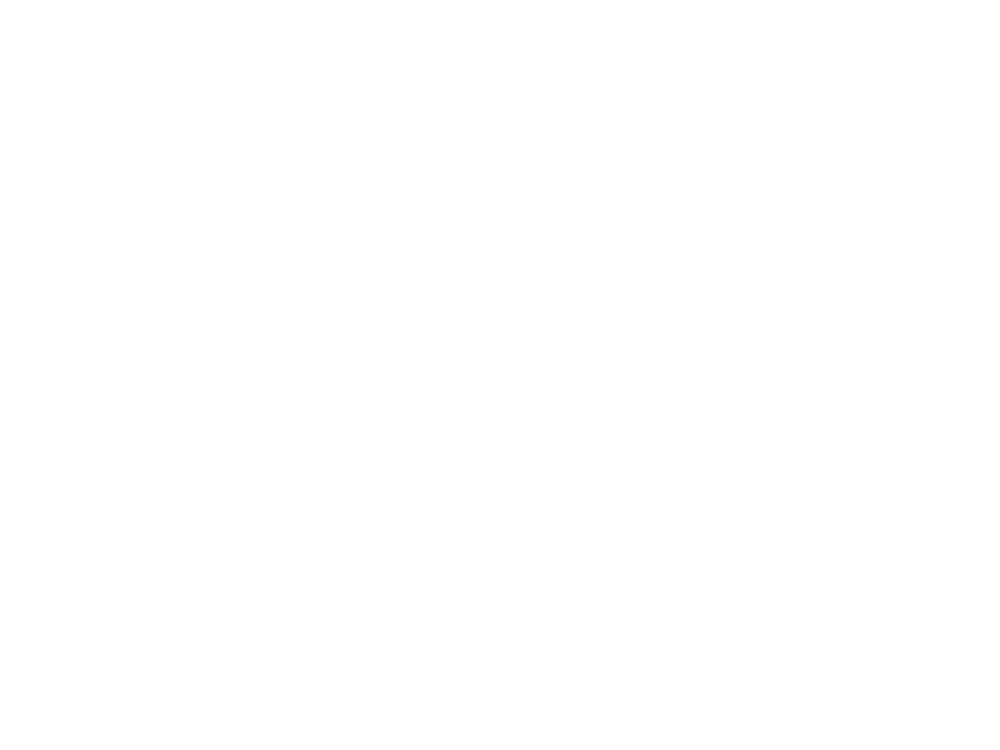

In [289]:
%matplotlib notebook
fig, ax = plt.subplots()
im = plt.imshow(ph_frames[0],interpolation='nearest',cmap='Blues')

ant_locs, = plt.plot([],[],'r.')

ax.add_patch(Circle(nest,2,linewidth=1,edgecolor='k',facecolor='sandybrown'))

rects = [plt.Rectangle((r,c),w,h,ec='orange', fc='orange') for (r,c,w,h,v) in foods]
for rect in rects:
    ax.add_patch(rect)
    
bricks = [plt.Rectangle((r,c),w,h,ec='k', fc='k') for (r,c,w,h,v) in blocks]
for brick in bricks:
    ax.add_patch(brick)

def animate(j):
    im.set_data(ph_frames[j])
    ant_locs.set_data(colony_frames[j][0],colony_frames[j][1])
    return [im]

# Make the actual animation
anim = animation.FuncAnimation(fig, animate, frames=NumFrames, interval=80)

#anim.save('ant_simulation_pheromones_far2.gif',writer=PillowWriter(fps=24))
plt.close()
HTML(anim.to_jshtml())       

In [290]:
anim.save('gifs/50_percent_prob_no_luck.gif',writer=PillowWriter(fps=24))